# Machine Learning and Visualizations for Spotify

This dataset contains the top songs streamed on Spotify from 2023. The dataset includes several features including track name, artist(s) name, release date, Spotify playlists and charts, streaming statistics, Apple Music presence, Deezer presence, Shazam charts, and various audio features.

The dataset is publicly included at https://drive.google.com/file/d/1LWZ914I0s9Ou2j0XA7brANMK3fnhWz2T/view?usp=sharing.

#### Exploratory Analysis and Visualizations

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

dataset_fp = r'/content/drive/MyDrive/Colab Notebooks/HDAG/spotify-2023.csv'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
from pathlib import Path
import csv
import datetime
import numpy as np
import matplotlib.pyplot as plt
import cv2
import seaborn as sns
from tqdm import tqdm
import pandas as pd
import sklearn
from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [ ]:
df_original = pd.read_csv(dataset_fp, encoding="latin-1")

In [ ]:
# Determine dtype of each column and why some are object instead of int
df_original.info()
df_original.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 953 entries, 0 to 952
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   track_name            953 non-null    object
 1   artist(s)_name        953 non-null    object
 2   artist_count          953 non-null    int64 
 3   released_year         953 non-null    int64 
 4   released_month        953 non-null    int64 
 5   released_day          953 non-null    int64 
 6   in_spotify_playlists  953 non-null    int64 
 7   in_spotify_charts     953 non-null    int64 
 8   streams               953 non-null    object
 9   in_apple_playlists    953 non-null    int64 
 10  in_apple_charts       953 non-null    int64 
 11  in_deezer_playlists   953 non-null    object
 12  in_deezer_charts      953 non-null    int64 
 13  in_shazam_charts      903 non-null    object
 14  bpm                   953 non-null    int64 
 15  key                   858 non-null    ob

,track_name,artist(s)_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,...,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,Seven (feat. Latto) (Explicit Ver.),"Latto, Jung Kook",2,2023,7,14,553,147,141381703,43,...,125,B,Major,80,89,83,31,0,8,4
1,LALA,Myke Towers,1,2023,3,23,1474,48,133716286,48,...,92,C#,Major,71,61,74,7,0,10,4
2,vampire,Olivia Rodrigo,1,2023,6,30,1397,113,140003974,94,...,138,F,Major,51,32,53,17,0,31,6
3,Cruel Summer,Taylor Swift,1,2019,8,23,7858,100,800840817,116,...,170,A,Major,55,58,72,11,0,11,15
4,WHERE SHE GOES,Bad Bunny,1,2023,5,18,3133,50,303236322,84,...,144,A,Minor,65,23,80,14,63,11,6


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_75, *['artist_count'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_76, *['released_year'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_77, *['released_month'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_78, *['released_day'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_79, *['artist_count'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_80, *['released_year'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_81, *['released_month'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_82, *['released_day'], **{})
chart

import numpy as np
from google.colab import autoviz

def categorical_histogram(df, colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  df.groupby(colname).size().plot(kind='barh', color=sns.palettes.mpl_palette(mpl_palette_name), figsize=(8*figscale, 4.8*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  return autoviz.MplChart.from_current_mpl_state()

chart = categorical_histogram(_df_83, *['track_name'], **{})
chart

import numpy as np
from google.colab import autoviz

def categorical_histogram(df, colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  df.groupby(colname).size().plot(kind='barh', color=sns.palettes.mpl_palette(mpl_palette_name), figsize=(8*figscale, 4.8*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  return autoviz.MplChart.from_current_mpl_state()

chart = categorical_histogram(_df_84, *['artist(s)_name'], **{})
chart

import numpy as np
from google.colab import autoviz

def categorical_histogram(df, colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  df.groupby(colname).size().plot(kind='barh', color=sns.palettes.mpl_palette(mpl_palette_name), figsize=(8*figscale, 4.8*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  return autoviz.MplChart.from_current_mpl_state()

chart = categorical_histogram(_df_85, *['streams'], **{})
chart

import numpy as np
from google.colab import autoviz

def categorical_histogram(df, colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  df.groupby(colname).size().plot(kind='barh', color=sns.palettes.mpl_palette(mpl_palette_name), figsize=(8*figscale, 4.8*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  return autoviz.MplChart.from_current_mpl_state()

chart = categorical_histogram(_df_86, *['in_deezer_playlists'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_87, *[[['artist_count', 'released_year'], ['released_year', 'released_month'], ['released_month', 'released_day'], ['released_day', 'in_spotify_playlists']]], **{})
chart

import numpy as np
from google.colab import autoviz

def heatmap(df, x_colname, y_colname, figscale=1, mpl_palette_name='viridis'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  import pandas as pd
  plt.subplots(figsize=(8 * figscale, 8 * figscale))
  df_2dhist = pd.DataFrame({
      x_label: grp[y_colname].value_counts()
      for x_label, grp in df.groupby(x_colname)
  })
  sns.heatmap(df_2dhist, cmap=mpl_palette_name)
  plt.xlabel(x_colname)
  plt.ylabel(y_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = heatmap(_df_88, *['track_name', 'artist(s)_name'], **{})
chart

import numpy as np
from google.colab import autoviz

def heatmap(df, x_colname, y_colname, figscale=1, mpl_palette_name='viridis'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  import pandas as pd
  plt.subplots(figsize=(8 * figscale, 8 * figscale))
  df_2dhist = pd.DataFrame({
      x_label: grp[y_colname].value_counts()
      for x_label, grp in df.groupby(x_colname)
  })
  sns.heatmap(df_2dhist, cmap=mpl_palette_name)
  plt.xlabel(x_colname)
  plt.ylabel(y_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = heatmap(_df_89, *['artist(s)_name', 'streams'], **{})
chart

import numpy as np
from google.colab import autoviz

def heatmap(df, x_colname, y_colname, figscale=1, mpl_palette_name='viridis'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  import pandas as pd
  plt.subplots(figsize=(8 * figscale, 8 * figscale))
  df_2dhist = pd.DataFrame({
      x_label: grp[y_colname].value_counts()
      for x_label, grp in df.groupby(x_colname)
  })
  sns.heatmap(df_2dhist, cmap=mpl_palette_name)
  plt.xlabel(x_colname)
  plt.ylabel(y_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = heatmap(_df_90, *['streams', 'in_deezer_playlists'], **{})
chart

import numpy as np
from google.colab import autoviz

def heatmap(df, x_colname, y_colname, figscale=1, mpl_palette_name='viridis'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  import pandas as pd
  plt.subplots(figsize=(8 * figscale, 8 * figscale))
  df_2dhist = pd.DataFrame({
      x_label: grp[y_colname].value_counts()
      for x_label, grp in df.groupby(x_colname)
  })
  sns.heatmap(df_2dhist, cmap=mpl_palette_name)
  plt.xlabel(x_colname)
  plt.ylabel(y_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = heatmap(_df_91, *['in_deezer_playlists', 'in_shazam_charts'], **{})
chart

import numpy as np
from google.colab import autoviz

def violin_plot(df, value_colname, facet_colname, figscale=1, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (12 * figscale, 1.2 * figscale * len(df[facet_colname].unique()))
  plt.figure(figsize=figsize)
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(_df_92, *['artist_count', 'track_name'], **{'inner': 'stick'})
chart

import numpy as np
from google.colab import autoviz

def violin_plot(df, value_colname, facet_colname, figscale=1, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (12 * figscale, 1.2 * figscale * len(df[facet_colname].unique()))
  plt.figure(figsize=figsize)
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(_df_93, *['artist_count', 'artist(s)_name'], **{'inner': 'stick'})
chart

import numpy as np
from google.colab import autoviz

def violin_plot(df, value_colname, facet_colname, figscale=1, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (12 * figscale, 1.2 * figscale * len(df[facet_colname].unique()))
  plt.figure(figsize=figsize)
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(_df_94, *['artist_count', 'streams'], **{'inner': 'stick'})
chart

import numpy as np
from google.colab import autoviz

def violin_plot(df, value_colname, facet_colname, figscale=1, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (12 * figscale, 1.2 * figscale * len(df[facet_colname].unique()))
  plt.figure(figsize=figsize)
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(_df_95, *['artist_count', 'in_deezer_playlists'], **{'inner': 'stick'})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_96, *['instrumentalness_%', 'artist_count', 'track_name'], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_97, *['instrumentalness_%', 'artist_count', 'artist(s)_name'], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_98, *['instrumentalness_%', 'artist_count', 'streams'], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_99, *['instrumentalness_%', 'artist_count', 'in_deezer_playlists'], **{})
chart

In [ ]:
df = df_original.copy()

In [ ]:
# Strings, cannot consider alongside ints
df = df.drop(['track_name', 'artist(s)_name', 'key'], axis=1)

In [ ]:
df.shape

(953, 24)

In [ ]:
# Clean dirty data by lookig for numeric and non-numeric cells.
# Instead of dropping a data point completely, impute missing/dirty values
# with the median value to coerce non-numeric values into numeric ones.

# Check for non-integer values in 'streams' column
dirty_streams_data = pd.DataFrame(df.streams.str.isdigit())
df[dirty_streams_data['streams'] == False]
# "stream" column, row 574 had random string instead of int
df['streams'][574] = np.nan

# Impute the missing/dirty values with the median value
df.streams.fillna(df.streams.median(), inplace=True)
df = df.astype({'streams': 'int64'})

<ipython-input-114-e63677384af5>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['streams'][574] = np.nan


In [ ]:
df.shape

(953, 21)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 953 entries, 0 to 952
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   artist_count          953 non-null    int64 
 1   released_year         953 non-null    int64 
 2   released_month        953 non-null    int64 
 3   released_day          953 non-null    int64 
 4   in_spotify_playlists  953 non-null    int64 
 5   in_spotify_charts     953 non-null    int64 
 6   streams               953 non-null    int64 
 7   in_apple_playlists    953 non-null    int64 
 8   in_apple_charts       953 non-null    int64 
 9   in_deezer_playlists   953 non-null    object
 10  in_deezer_charts      953 non-null    int64 
 11  in_shazam_charts      903 non-null    object
 12  bpm                   953 non-null    int64 
 13  mode                  953 non-null    object
 14  danceability_%        953 non-null    int64 
 15  valence_%             953 non-null    in

In [ ]:
# Convert minor and major columns to 0 and 1 to be able to be processed with rest of ints
df.replace('Minor', 0, inplace=True)
df.replace('Major', 1, inplace=True)
df = df.astype({'mode': 'int64'})

In [ ]:
# in_deezer_playlists and in_shazam_charts have string/object dtypes because of commas
df = df.replace(',', '', regex=True)

df['in_shazam_charts'] = pd.to_numeric(df['in_shazam_charts'], errors='coerce')
# Impute the missing values with the median value instead of dropping them
df.in_shazam_charts.fillna(df.in_shazam_charts.median(), inplace=True)
df['in_deezer_playlists'] = pd.to_numeric(df['in_deezer_playlists'], errors='coerce')
# Impute the missing values with the median value instead of dropping them
df.in_deezer_playlists.fillna(df.in_deezer_playlists.median(), inplace=True)

In [ ]:
# Verify no rows of data were lost and original shape maintained
df.shape

(953, 21)

In [ ]:
df = df.astype({'in_shazam_charts':'int64', 'in_deezer_playlists':'int64'})

In [ ]:
df.streams.fillna(df.streams.median(), inplace=True)

In [ ]:
# All dtypes in df are now ints
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 953 entries, 0 to 952
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   artist_count          953 non-null    int64
 1   released_year         953 non-null    int64
 2   released_month        953 non-null    int64
 3   released_day          953 non-null    int64
 4   in_spotify_playlists  953 non-null    int64
 5   in_spotify_charts     953 non-null    int64
 6   streams               953 non-null    int64
 7   in_apple_playlists    953 non-null    int64
 8   in_apple_charts       953 non-null    int64
 9   in_deezer_playlists   953 non-null    int64
 10  in_deezer_charts      953 non-null    int64
 11  in_shazam_charts      953 non-null    int64
 12  bpm                   953 non-null    int64
 13  mode                  953 non-null    int64
 14  danceability_%        953 non-null    int64
 15  valence_%             953 non-null    int64
 16  energy_%

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
artist_count,953.0,1.556139e+00,8.930442e-01,1.0,1.0,1.0,2.0,8.000000e+00
released_year,953.0,2.018238e+03,1.111622e+01,1930.0,2020.0,2022.0,2022.0,2.023000e+03
released_month,953.0,6.033578e+00,3.566435e+00,1.0,3.0,6.0,9.0,1.200000e+01
released_day,953.0,1.393075e+01,9.201949e+00,1.0,6.0,13.0,22.0,3.100000e+01
in_spotify_playlists,953.0,5.200125e+03,7.897609e+03,31.0,875.0,2224.0,5542.0,5.289800e+04
in_spotify_charts,953.0,1.200944e+01,1.957599e+01,0.0,0.0,3.0,16.0,1.470000e+02
streams,953.0,5.139028e+08,5.666055e+08,2762.0,141720999.0,290530915.0,673801126.0,3.703895e+09
in_apple_playlists,953.0,6.781217e+01,8.644149e+01,0.0,13.0,34.0,88.0,6.720000e+02
in_apple_charts,953.0,5.190871e+01,5.063024e+01,0.0,7.0,38.0,87.0,2.750000e+02
in_deezer_playlists,953.0,3.851878e+02,1.130536e+03,0.0,13.0,44.0,164.0,1.236700e+04


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_100, *['mean'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_101, *['std'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_102, *['min'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_103, *['25%'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_104, *['mean'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_105, *['std'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_106, *['min'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_107, *['25%'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_108, *[[['mean', 'std'], ['std', 'min'], ['min', '25%'], ['25%', '50%']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_109, *['count', 'mean', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_110, *['count', 'std', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_111, *['count', 'min', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_112, *['count', '25%', None], **{})
chart

In [ ]:
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax, color="maroon")
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(df, *[[['artist_count', 'released_year'], ['released_year', 'released_month'], ['released_month', 'released_day'], ['released_day', 'in_spotify_playlists']]], **{})
chart

artist_count
Skew : 2.54


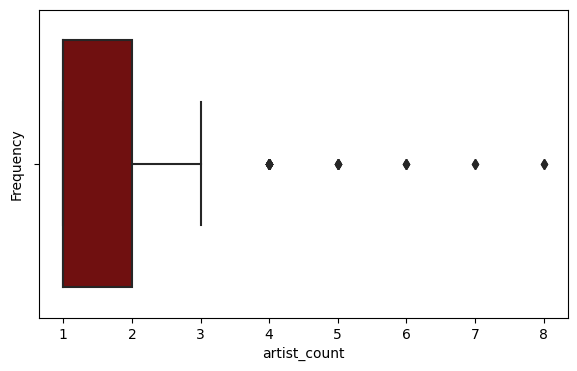

released_year
Skew : -4.29


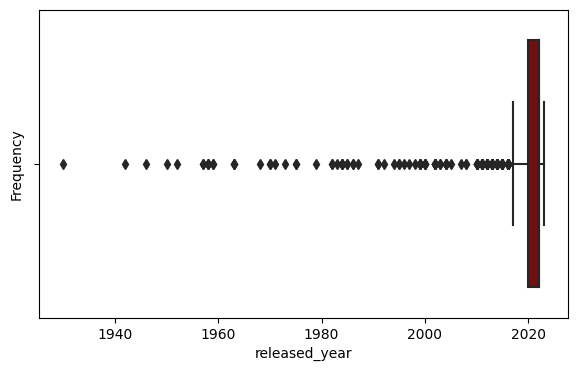

released_month
Skew : 0.18


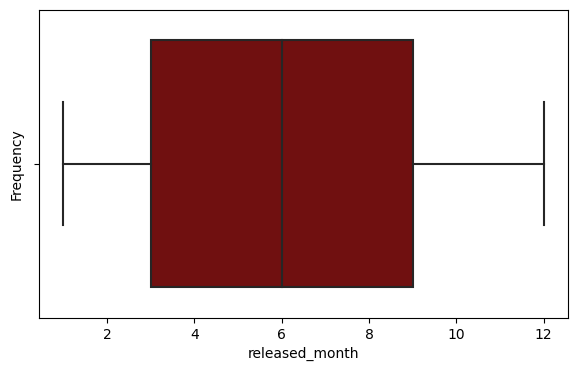

released_day
Skew : 0.16


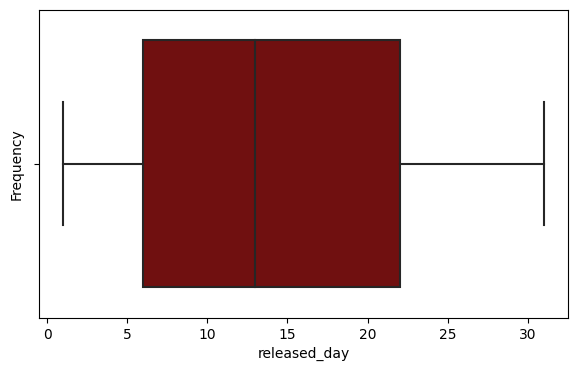

in_spotify_playlists
Skew : 2.93


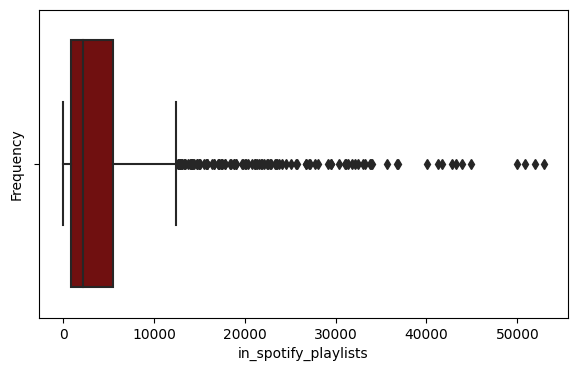

in_spotify_charts
Skew : 2.58


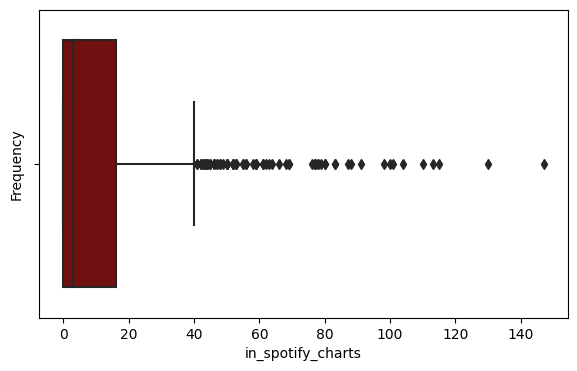

streams
Skew : 2.0


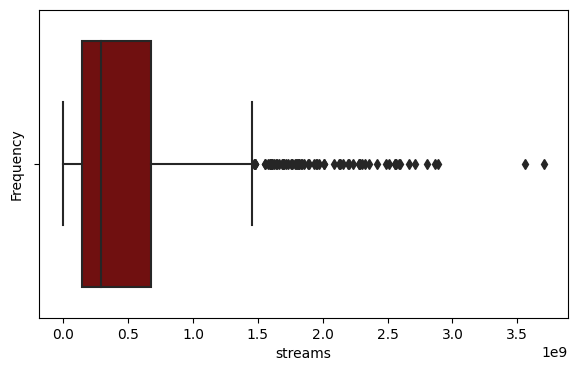

in_apple_playlists
Skew : 2.47


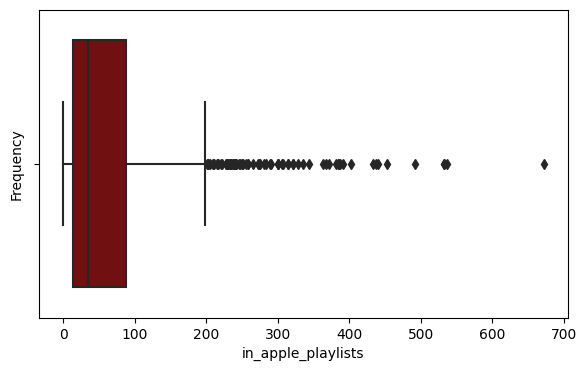

in_apple_charts
Skew : 1.04


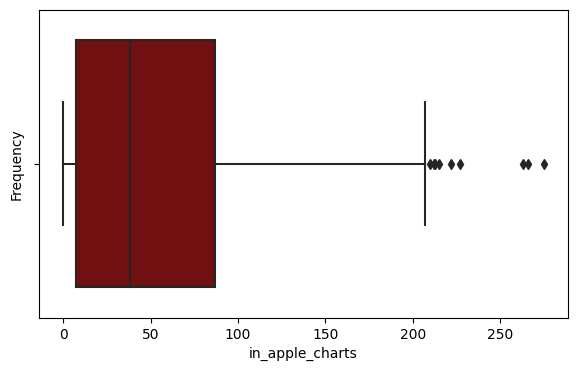

in_deezer_playlists
Skew : 4.96


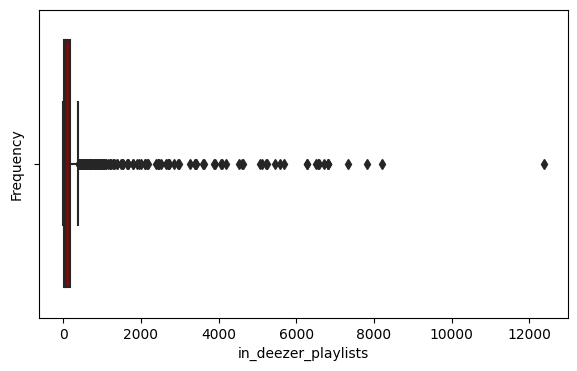

in_deezer_charts
Skew : 3.77


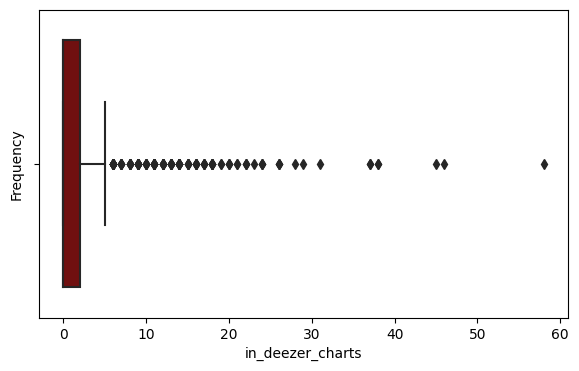

in_shazam_charts
Skew : 4.84


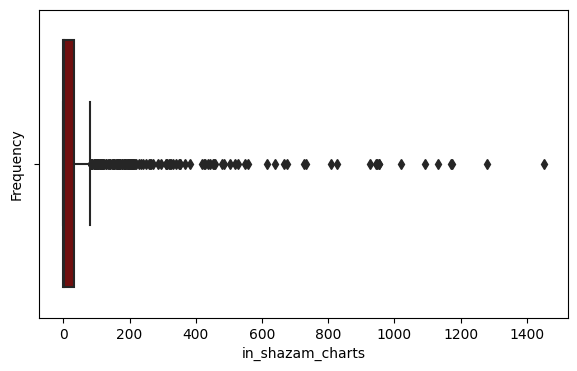

bpm
Skew : 0.41


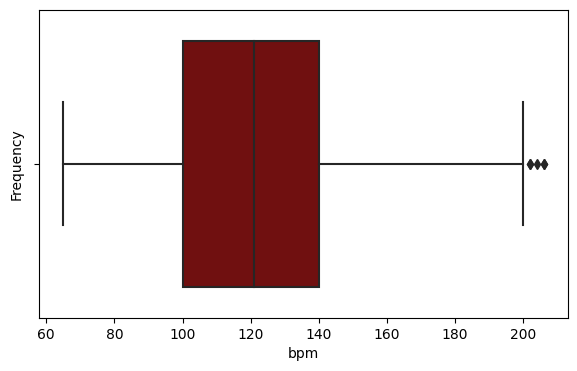

mode
Skew : -0.31


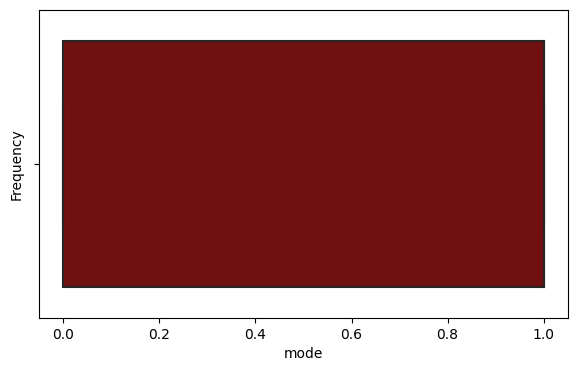

danceability_%
Skew : -0.44


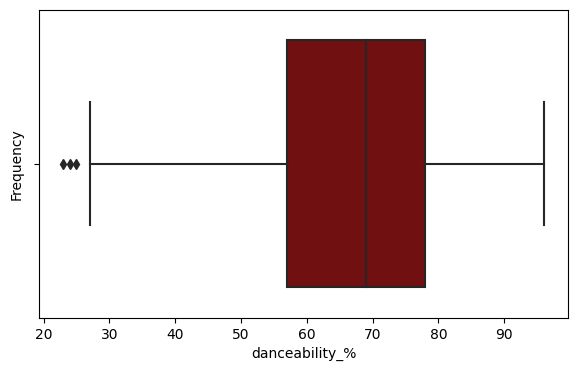

valence_%
Skew : 0.01


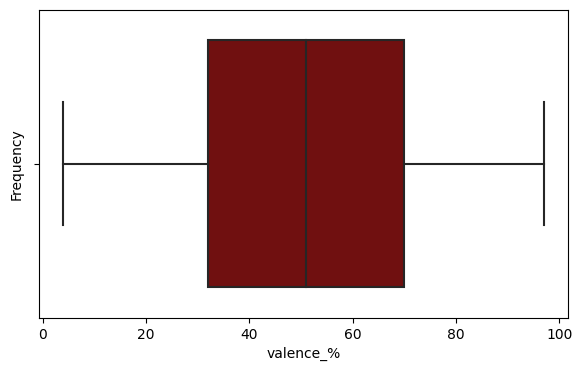

energy_%
Skew : -0.45


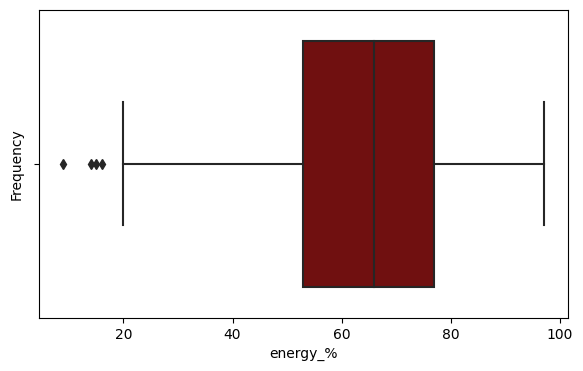

acousticness_%
Skew : 0.95


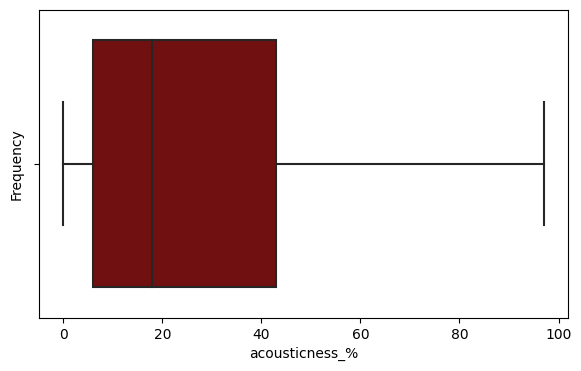

instrumentalness_%
Skew : 7.12


KeyboardInterrupt: ignored

In [ ]:
for col in df.columns:
     print(col)
     print('Skew :', round(df[col].skew(), 2))
     plt.figure(figsize=(15, 4))
    #  plt.subplot(1, 1, 1)
    #  df[col].hist(color="maroon")
     plt.subplot(1, 2, 2)
     sns.boxplot(x=df[col], color="maroon")
     plt.ylabel('Streams (in billions)')
     plt.ylabel('Frequency')
     plt.show()

1. 953 songs are in the dataset, each accompanied by 24 attributes. These attributes encompass track names, artist names, release dates, song playlist counts across various platforms, tempo (bpm), musical key, mode, and a series of 7 "percentage" metrics evaluating diverse aspects of the song such as  "danceability" and "energy".

In [ ]:
# freq table
pd.crosstab(df['artist_count'], "Number of Songs", rownames=[""], colnames=["Artist Count"])

Artist Count,Number of Songs
,
1,587
2,254
3,85
4,15
5,5
6,3
7,2
8,2


As observed in the table, 587 songs are attributed to a single artist, 254 songs are attributed to two artists, 85 songs involve three artists, and the remaining songs involve collaboration between four to eight artists.

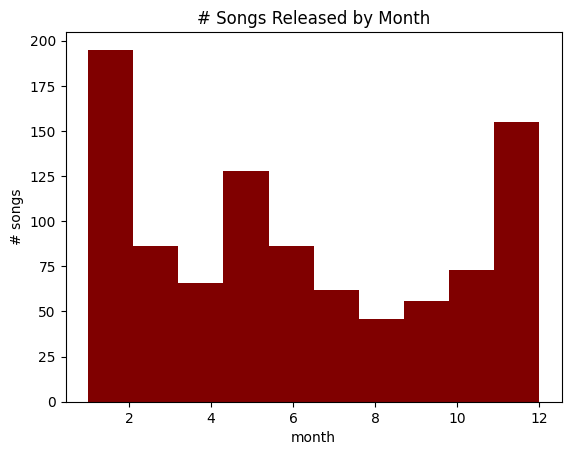

In [ ]:
histogram = df.hist(column="released_month", grid=False, color = "maroon")
plt.ylabel("# songs")
plt.xlabel("month")
plt.title("# Songs Released by Month")
plt.show()

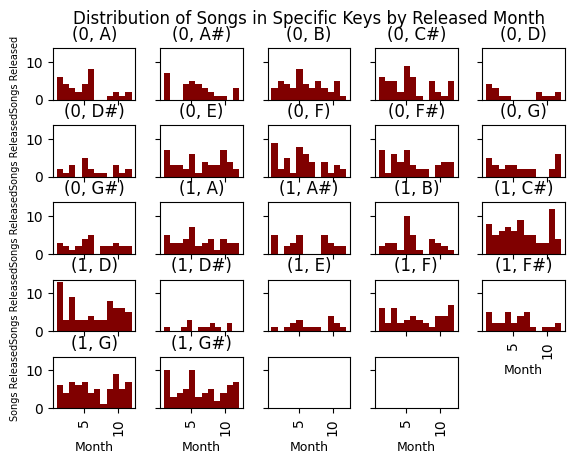

In [ ]:
# Create a histogram showing the distribution of song releases by month for specific keys and modes
histogram2 = df.hist(column="released_month",
                    sharex=True,
                    sharey=True,
                    bins=12,
                    by=["mode", "key"],
                    grid=False,
                    color="maroon")
plt.suptitle("Distribution of Songs in Specific Keys by Released Month")

# Label the x and y axes for each subplot in histogram2
for axs in histogram2.flatten():
    axs.set_xlabel("Month", fontsize=9)
    axs.set_ylabel("Songs Released", fontsize=7)

plt.show()

The histograms displayed provide insights into the seasonal patterns of song releases across different musical keys. They not only reveal popular key choices, such as D# minor, but also highlight how songs in specific keys tend to coincide with particular seasons. For instance, it becomes evident that songs employing the E minor scale typically release during the winter season.

<ipython-input-42-61a0064c99cd>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True)


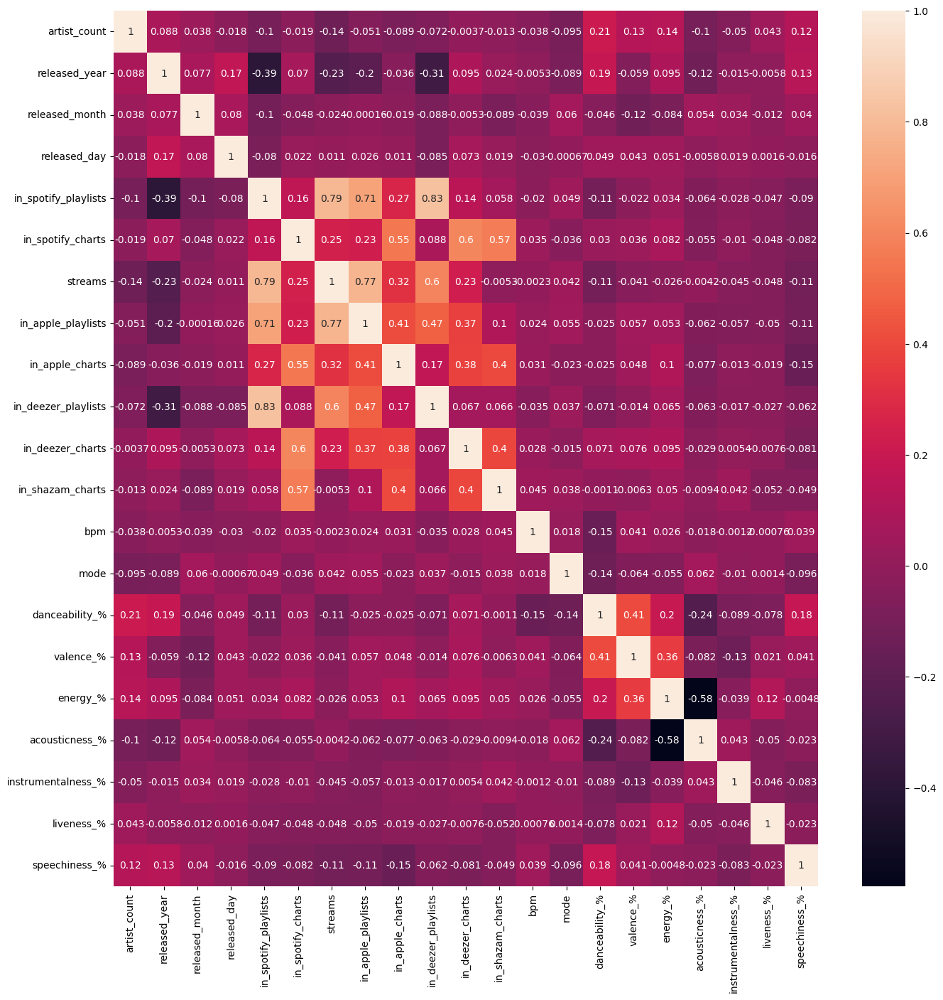

In [ ]:
plt.figure(figsize=(16, 16))
sns.heatmap(df.corr(), annot=True)
plt.show()

---

#### Data Cleaning and Initial Relationships

1. Some artists are represented multiple times in the charts - for instance, Taylor Swift has 34 solo songs in this dataset! We can first count the number of songs by 5 select artists (accounting for collabs with other artists). \\

2. We can create a new variable that is a dummy variable where it is "1" if any of the 5 selected artists participated in that song. A similar approach will then be used to identify who the top 5 artists are by the number of songs in this dataset. \\

3. A scatter plot can be created that compares streams to total number of playlists by an artist.

4. A visualization can be created that shows how valence, danceability, and energy are related to the popularity of a song.


In [ ]:
# Create a dictionary to count the number of songs by 5 selected artists
artist_frequency = {
    "Jung Kook": 0,
    "Olivia Rodrigo": 0,
    "Burna Boy": 0,
    "Selena Gomez": 0,
    "Myke Towers": 0
}

# Create a list to track whether one of the 5 selected artists participated in each song
chosen_five = []

# Iterate through the DataFrame rows
for (index, row) in df.iterrows():
    # Split the artist(s) names by commas since they may have multiple artists
    song_artists = row["artist(s)_name"].split(", ")
    # Initialize a variable to track if one of the selected artists participated in the song
    has_chosen = "0"
    # Check if any of the artists in the song are among the selected 5 artists
    for artist in song_artists:
        if artist in artist_frequency:
            artist_frequency[artist] += 1
            has_chosen = "1"
    chosen_five.append(has_chosen)

# Print count of songs by each artist
print(artist_frequency)

# Insert a new column in the DataFrame to indicate whether one of the 5 selected artists participated
df.insert(2, "chosen_five", chosen_five)

df

{'Jung Kook': 2, 'Olivia Rodrigo': 7, 'Burna Boy': 2, 'Selena Gomez': 1, 'Myke Towers': 1}


,track_name,artist(s)_name,chosen_five,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,...,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,Seven (feat. Latto) (Explicit Ver.),Latto Jung Kook,0,2,2023,7,14,553,147,141381703,...,125,B,1,80,89,83,31,0,8,4
1,LALA,Myke Towers,1,1,2023,3,23,1474,48,133716286,...,92,C#,1,71,61,74,7,0,10,4
2,vampire,Olivia Rodrigo,1,1,2023,6,30,1397,113,140003974,...,138,F,1,51,32,53,17,0,31,6
3,Cruel Summer,Taylor Swift,0,1,2019,8,23,7858,100,800840817,...,170,A,1,55,58,72,11,0,11,15
4,WHERE SHE GOES,Bad Bunny,0,1,2023,5,18,3133,50,303236322,...,144,A,0,65,23,80,14,63,11,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
948,My Mind & Me,Selena Gomez,1,1,2022,11,3,953,0,91473363,...,144,A,1,60,24,39,57,0,8,3
949,Bigger Than The Whole Sky,Taylor Swift,0,1,2022,10,21,1180,0,121871870,...,166,F#,1,42,7,24,83,1,12,6
950,A Veces (feat. Feid),Feid Paulo Londra,0,2,2022,11,3,573,0,73513683,...,92,C#,1,80,81,67,4,0,8,6
951,En La De Ella,Feid Sech Jhayco,0,3,2022,10,20,1320,0,133895612,...,97,C#,1,82,67,77,8,0,12,5


In [ ]:
# Challenge
artist_frequency = {} # A dictionary to store artist frequencies
top_five_artists = {} # A dictionary to store the top 5 artists

# Iterating thru df to count artist frequencies
for (i, r) in df.iterrows():
  # Splitting artist(s) names by commas as there might be multiple artists
  song_artists = r["artist(s)_name"].split(", ")
  has_top = "0"

  for artist in song_artists:
    if artist in artist_frequency:
      artist_frequency[artist] += 1 # Updating the frequency count
    else:
      artist_frequency.update({artist: 1}) # Adding a new entry to the dictionary

top_five_artists = dict(sorted(artist_frequency.items(), key=lambda x: x[1], reverse=True)[:5])
print("Top 5 Artists:", top_five_artists)
top_five = []

# split artists by commas
for (i, r) in df.iterrows():
  song_artists = r["artist(s)_name"].split(", ")

  has_top = "0"
  for artist in song_artists:
    if artist in top_five_artists:
      has_top = "1" # Updating the variable to indicate involvement of a top artist
    top_five.append(has_top)

print(top_five)

Top 5 Artists: {'Bad Bunny': 40, 'Taylor Swift': 38, 'The Weeknd': 37, 'SZA': 23, 'Kendrick Lamar': 23}
['0', '0', '0', '0', '1', '1', '0', '0', '0', '0', '0', '0', '0', '0', '1', '1', '0', '0', '0', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '0', '0', '1', '1', '1', '0', '0', '0', '0', '1', '0', '0', '0', '0', '0', '1', '1', '1', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '1', '1', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '0', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '0', '0', '0', '0', '0', '1', '0', '0', '0', '0', '0', '1', '1', '1', '0', '0', '0', '0', '1', '0', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '1', '0', '0', '0', '1', '0', '0', '0', 

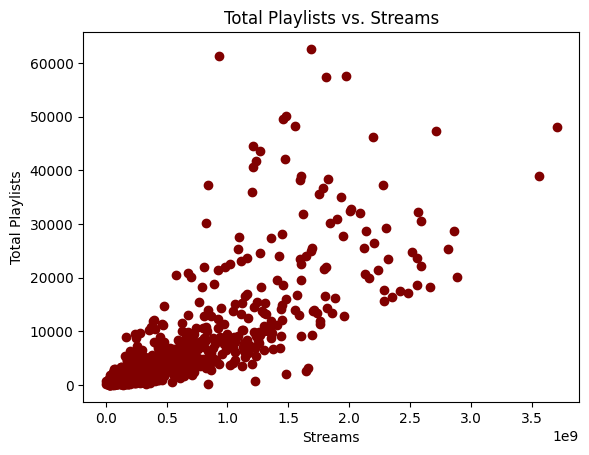

In [ ]:
total_playlists = df['in_spotify_playlists'] + df['in_apple_playlists'] + df['in_deezer_playlists']

# visualization
plt.scatter(df['streams'], total_playlists, marker='o', color='maroon')
plt.title('Total Playlists vs. Streams')
plt.xlabel('Streams')
plt.ylabel('Total Playlists')
plt.show()

<>:13: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:13: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:13: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:13: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<ipython-input-96-6795cdb6e24d>:13: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if artist is not "Taylor Swift" or artist is not "21 Savage":
<ipython-input-96-6795cdb6e24d>:13: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if artist is not "Taylor Swift" or artist is not "21 Savage":


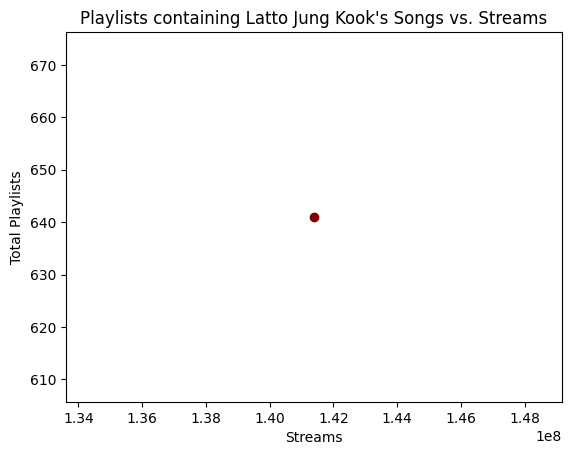

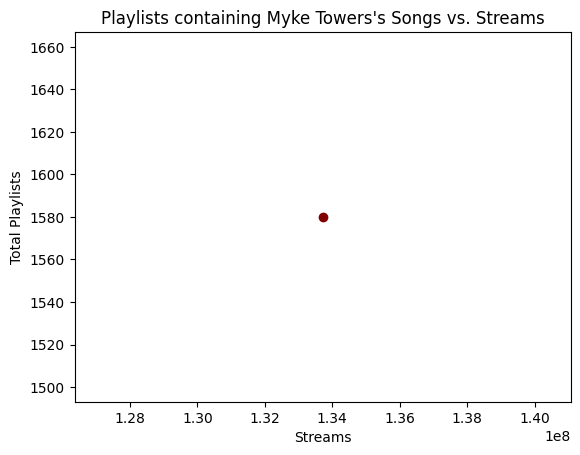

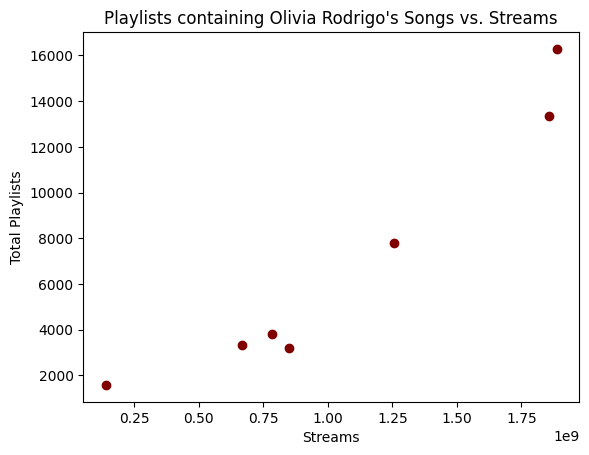

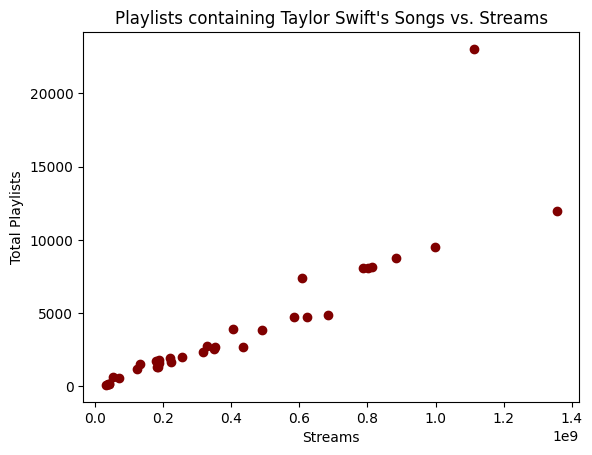

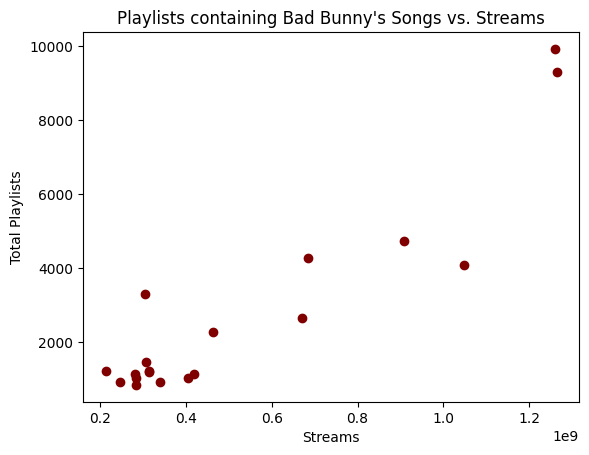

...

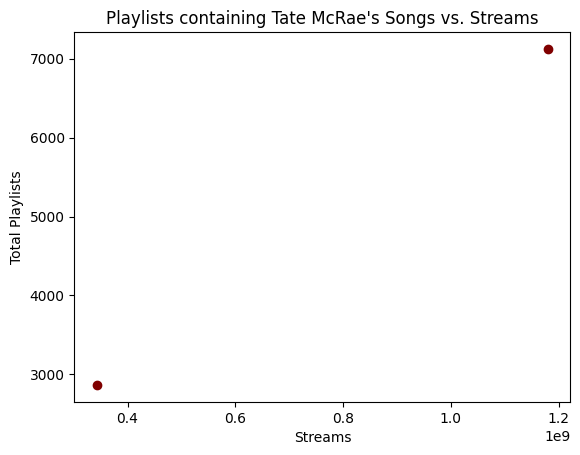

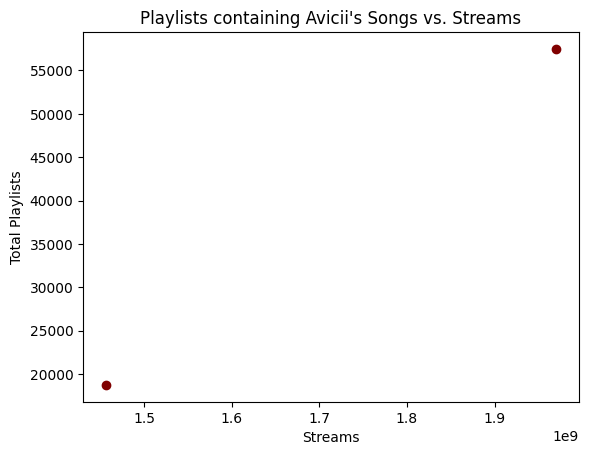

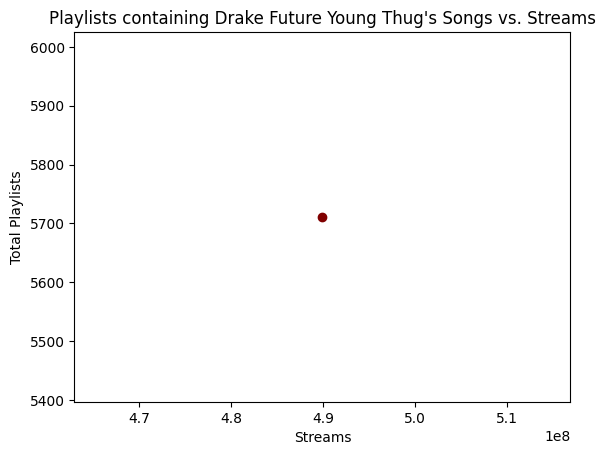

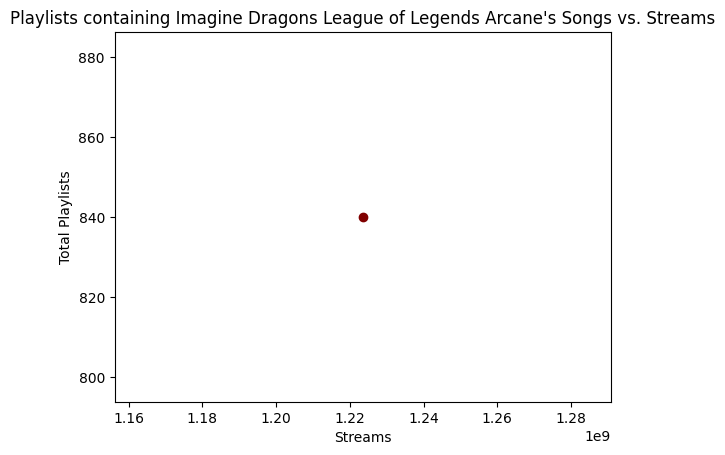

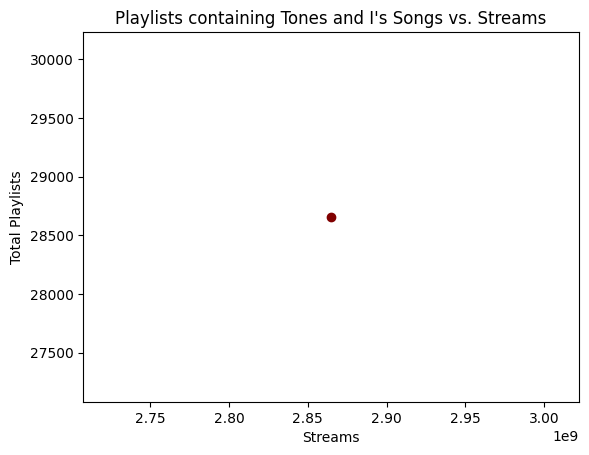

KeyboardInterrupt: ignored

In [ ]:
# We are creating a scatterplot for the top 5 artists, as there are nearly 700 artists,
# and creating a scatterplot for each one would not be practical or interesting.

# Initialize a dictionary to store artist playlists data
artist_playlists = {}

# Iterate through the rows of the dataframe
for (index, row) in df.iterrows():
    # Split the "artist(s)_name" by commas, as artists are separated by commas
    song_artists = row["artist(s)_name"].split(", ")
    for artist in song_artists:
        # Comment out the following line to plot for all artists
        if artist is not "Taylor Swift" or artist is not "21 Savage":
          sum_playlists = row["in_spotify_playlists"] + row["in_apple_playlists"] + row["in_deezer_playlists"]
          if artist_playlists.get(artist) is not None:
              # If the artist is already in the dictionary, append data
              artist_playlists[artist][0].append(row["streams"])
              artist_playlists[artist][1].append(sum_playlists)
          else:
              # If the artist is not in the dictionary, add a new entry
              artist_playlists.update({artist: [[row["streams"]], [sum_playlists]]})

# Create scatterplots for each artist in the dictionary
for artist, info in artist_playlists.items():
    plt.scatter(info[0], info[1], marker='o', color='maroon')
    plt.title(f'Playlists containing {artist}\'s Songs vs. Streams')
    plt.xlabel('Streams')
    plt.ylabel('Total Playlists')
    plt.show()

Comparing an artist such as Taylor Swift to 21Savage, for example, we see that Taylor Swift's correlation coefficient is much higher and thus indicates that he has a more loyal fanbase. The plot above also illustrates a clear positive relationship between the song's number of streams and the number of playlists it appears in. This observation aligns with our intuition, as it is expected that more popular songs are frequently included in playlists.

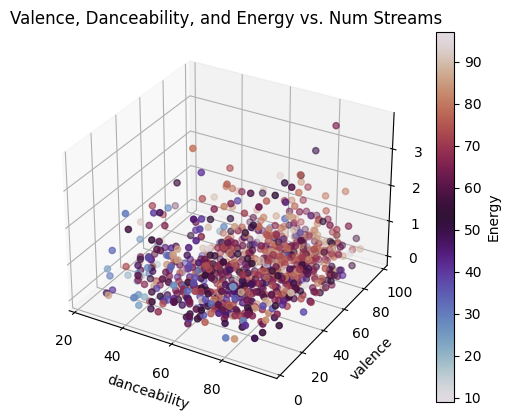

In [ ]:
# visual of how a combination of valence, danceability, and energy are related to the popularity of a song
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df['danceability_%'],
                     df['valence_%'],
                     df['streams'],
                     c=df['energy_%'],
                     cmap='twilight',
                     marker='o')

ax.set_xlabel('danceability')
ax.set_ylabel('valence')
ax.set_zlabel('streams')
plt.title("Valence, Danceability, and Energy vs. Num Streams")
fig.colorbar(scatter, label='Energy')
plt.show()

This graph enables us to assess a song's popularity in connection to its valence, danceability, and energy characteristics. In particular, we can see a correlation between the point's vertical (z) position, which represents the number of streams, and its color, which corresponds to energy. It also appears that valence, danceability, and energy all show a positive correlation between each other. That is, the variables tend to increase together.

---

#### Analysis

As you have explored, there are lots of features in this dataset. Here, we ask you to identify a concrete question of interest and present your findings: this is a great place to showcase more visualization and machine learning (should you want to) skills! Here are a few suggested topics, but please feel free to explore others that interest you.

1. Can we use certain features like bpm and key to predict the number of playlists a song is included in? \\
2. What are some larger trends in the music market? Are songs getting faster? more livelier? more featuring artists? \\
3. How do ranks of songs vary across different platforms? Are there any noticeable differences? \\
4. How do you think the danceability, valence, and energy variables are calculated? Are there any significant correlations between them? Can we use others to predict one to reduce the number of features?



The goal of my analysis was two-fold.
I first wanted to determine how Principal Component Analysis and t-distributed Stochastic Neighbor Embedding can downsample the dataset's complexity through dimensionality reduction and uncover valuable insights on how the features presented influence the number of streams a song receives.
I next implemented a permutation importance algorithm to assess the significance of individual features and predict which statistics contribute most to earning a song a high number of streams.

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [ ]:
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

In [ ]:
# Number of principal components
n = df_scaled.shape[1]
pca = PCA(n_components=n, random_state=1) # Apply the PCA algorithm with random state = 1
data_pca1 = pd.DataFrame(pca.fit_transform(df_scaled)) # Fit and transform the PCA function on scaled data

# The percentage of variance explained by each principal component
pca_expvar = pca.explained_variance_ratio_

Text(0, 0.5, 'Cumulative Explained Variance')

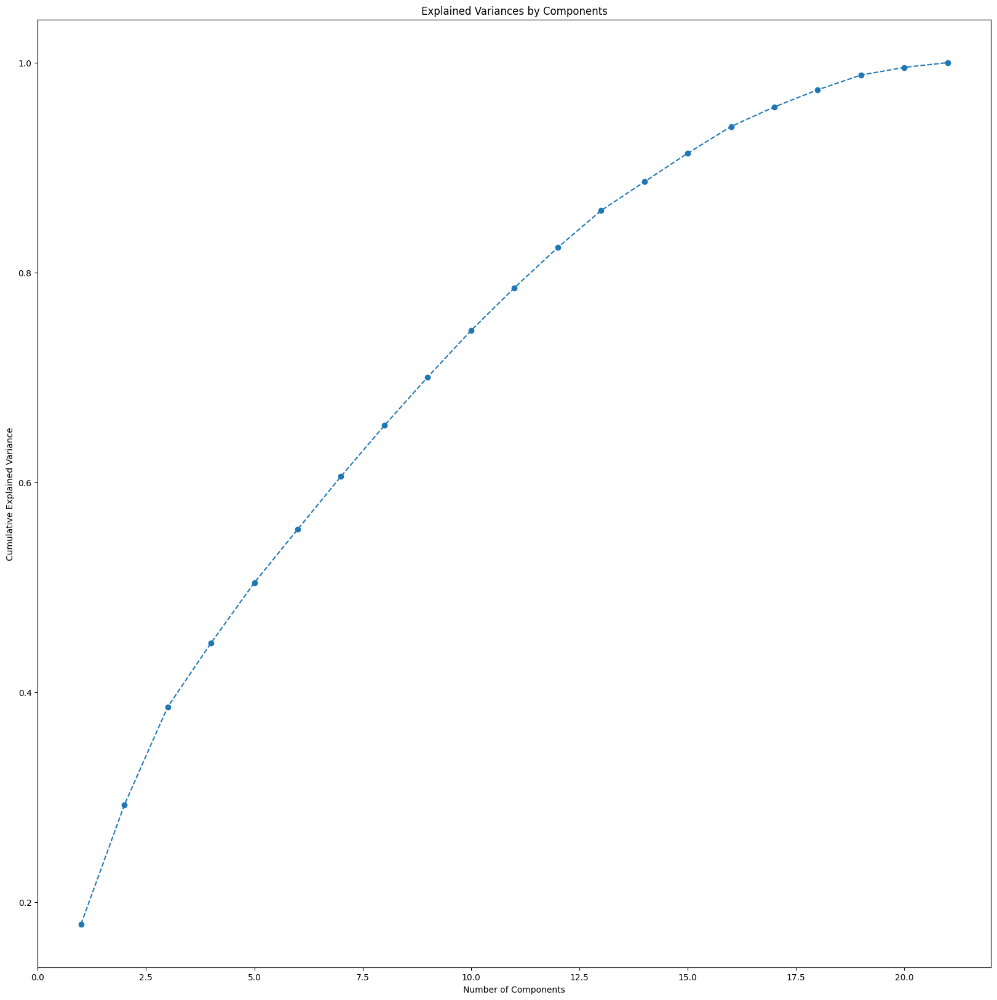

In [ ]:
# Plot the explained variance per each component
plt.figure(figsize = (20, 20))
plt.plot(range(1, 22), pca_expvar.cumsum(), marker = 'o', linestyle = '--')
plt.title("Explained Variances by Components")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")

In [ ]:
# Determine num components that can explain more than 80% variance combined
exp_variance = 0
for i, component in enumerate(pca_expvar):
  exp_variance += component
  if(sum > 0.80):
    print("Number of principal components necessary to to achieve >80% variance:", i+1)
    break

Number of principal components necessary to to achieve >80% variance: 1


In [ ]:
pc_comps = ['PC1','PC2','PC3']
data_pca = pd.DataFrame(np.round(pca.components_[:3,:],2), index=pc_comps, columns=df_scaled.columns)
data_pca.T

,PC1,PC2,PC3
artist_count,-0.08,0.18,-0.19
released_year,-0.17,0.28,0.10
released_month,-0.05,-0.05,0.11
released_day,-0.02,0.11,0.05
in_spotify_playlists,0.44,-0.19,-0.21
in_spotify_charts,0.26,0.35,0.32
streams,0.43,-0.15,-0.11
in_apple_playlists,0.42,-0.03,-0.10
in_apple_charts,0.31,0.23,0.21
in_deezer_playlists,0.36,-0.18,-0.23


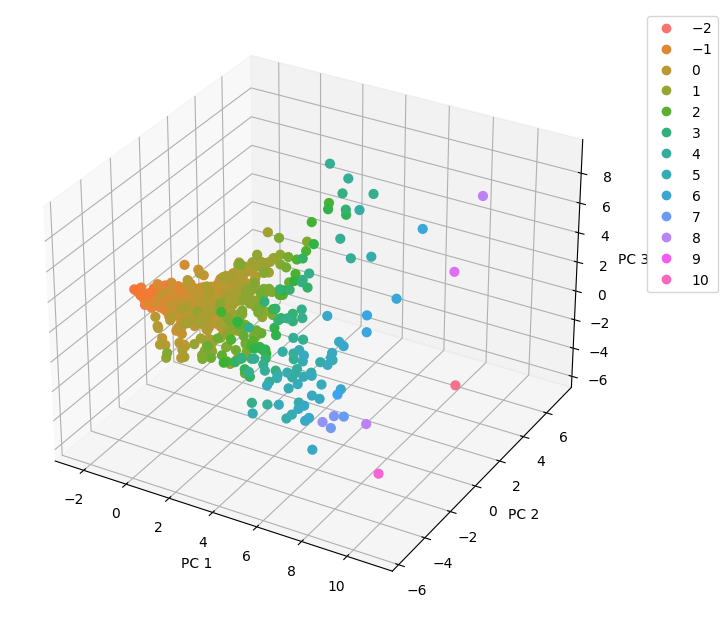

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap

# 2D Implementation
# plt.figure(figsize = (7,7))
# sns.scatterplot(x=data_pca1[0], y=data_pca1[1], z=data_pca1[2])
# plt.xlabel("PC1")
# plt.ylabel("PC2")

# 3D Implementation
fig = plt.figure(figsize=(6,6))
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)

cmap = ListedColormap(sns.color_palette("husl", 256).as_hex()) # Imported color map
sc = ax.scatter(data_pca1[0], data_pca1[1], data_pca1[2], c=data_pca1[0], s=40, marker='o', cmap=cmap, alpha=1)

ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
ax.set_zlabel('PC 3')

plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)

plt.show()

In [ ]:
# df_concat = pd.concat([data_pca1, data], axis=1)

# plt.figure(figsize = (12, 12))
# # Create a scatter plot with x=0 and y=1 using df_concat dataframe
# sns.scatterplot(data = df_concat, x=df_concat[0], y=df_concat[1], hue ='streams')
# plt.xlabel("PC1")
# plt.ylabel("PC2")

---

In [ ]:
tsne = TSNE(n_components = 3, random_state=1)

#Fit and transform tsne function on the scaled data
data_tsne = tsne.fit_transform(df_scaled)

In [ ]:
data_tsne.shape
data_tsne = pd.DataFrame(data = data_tsne, columns = ['Component 1', 'Component 2', 'Component 3'])
data_tsne.head()

,Component 1,Component 2,Component 3
0,14.442552,1.115511,-31.324017
1,13.682328,-7.978225,-13.411602
2,17.769863,-1.851050,-30.526087
3,17.836514,0.784641,-28.463800
4,-15.391900,42.427963,13.975684


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_113, *['Component 1'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_114, *['Component 2'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_115, *['Component 3'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_116, *['Component 1'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_117, *['Component 2'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_118, *['Component 3'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_119, *[[['Component 1', 'Component 2'], ['Component 2', 'Component 3']]], **{})
chart

In [ ]:
# sns.scatterplot(x=data_tsne.iloc[:, 0], y=data_tsne.iloc[:,1])
sns.scatterplot(x=data_tsne.iloc[:, 0], y=data_tsne.iloc[:, 1], label='Feature1 vs. Feature2', marker='o', color='blue')
sns.scatterplot(x=data_tsne.iloc[:, 0], y=data_tsne.iloc[:, 2], label='Feature1 vs. Feature3', marker='s', color='red')

In [ ]:
# Lets assign points to the 3 different groups
def grouping(x):
    first_component = x['Component 1']
    second_component = x['Component 2']
    if (first_component> 0) and (second_component >0):
        return 'group_1'
    if (first_component >-20 ) and (first_component < 5):
        return 'group_2'
    else:
        return 'group_3'

In [ ]:
data_tsne['groups'] = data_tsne.apply(grouping,axis=1)

In [ ]:
sns.scatterplot(x=data_tsne.iloc[:, 0], y=data_tsne.iloc[:, 1], hue=data_tsne.iloc[:,2])

In [ ]:
df['groups'] = data_tsne['groups']

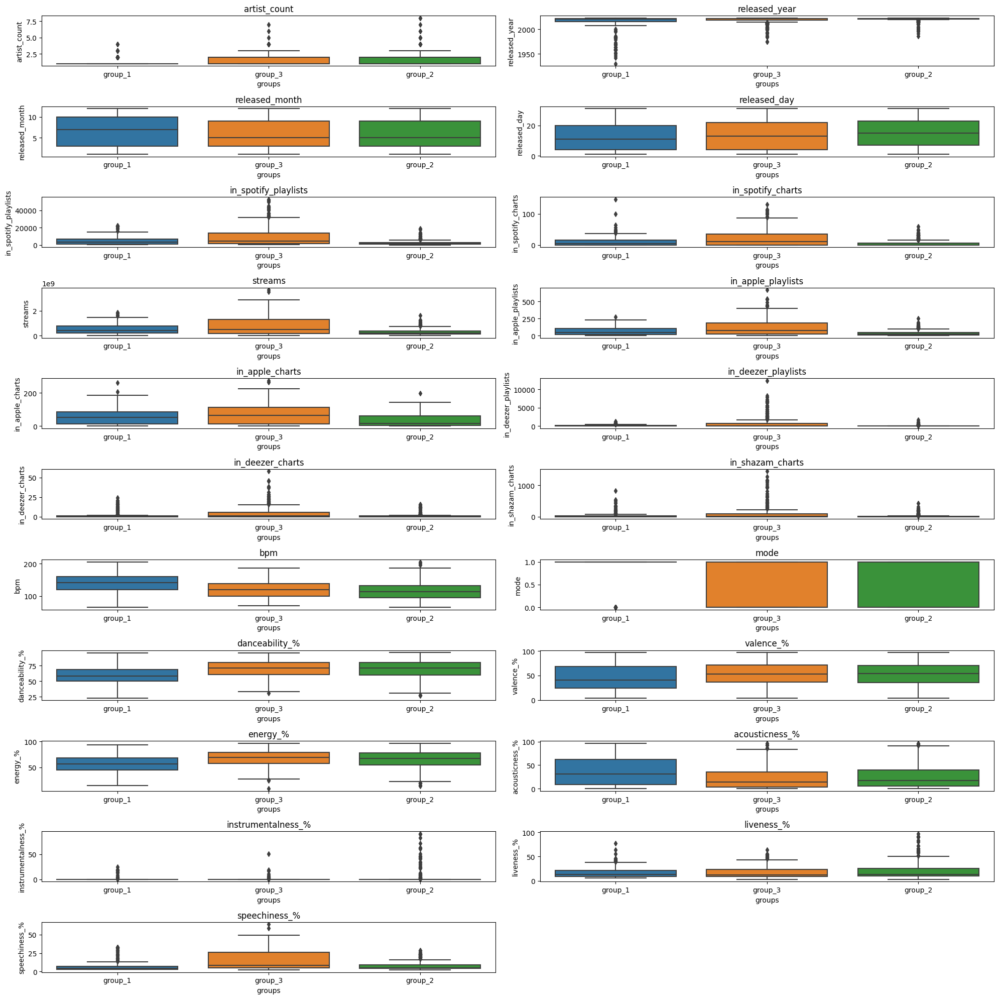

In [ ]:
all_col = df.columns.tolist()
plt.figure(figsize=(20, 20))

for i, variable in enumerate(all_col):
    if i==21:
        break
    plt.subplot(11, 2, i + 1)
    #Create boxplot with groups on the x-axis
    sns.boxplot(y=df[variable], x=df['groups'])
    plt.tight_layout()
    plt.title(variable)
plt.show()

---
Permutation Importance

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

y = (df['streams'])
feature_names = [i for i in df.columns if df[i].dtype in [np.int64]]
X = df[feature_names]
train_X, val_X, train_y, val_y = train_test_split(X, y, random_state=1)
my_model = RandomForestClassifier(n_estimators=100,
                                  random_state=0).fit(train_X, train_y)

In [ ]:
!pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107719 sha256=f2d0d5b6b2509ef23f112524c4a3801f6026620e204108b41a0327680bcc7540
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 953 entries, 0 to 952
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   artist_count          953 non-null    int64
 1   released_year         953 non-null    int64
 2   released_month        953 non-null    int64
 3   released_day          953 non-null    int64
 4   in_spotify_playlists  953 non-null    int64
 5   in_spotify_charts     953 non-null    int64
 6   streams               953 non-null    int64
 7   in_apple_playlists    953 non-null    int64
 8   in_apple_charts       953 non-null    int64
 9   in_deezer_playlists   953 non-null    int64
 10  in_deezer_charts      953 non-null    int64
 11  in_shazam_charts      953 non-null    int64
 12  bpm                   953 non-null    int64
 13  mode                  953 non-null    int64
 14  danceability_%        953 non-null    int64
 15  valence_%             953 non-null    int64
 16  energy_%

In [ ]:
import eli5
from eli5.sklearn import PermutationImportance

bad bunny's # streams vs total playlists (number of playlists that the artist's songs have been added to) is a direct correlation to how loyal their fanbase is (tswift had the highest R^2 value versus bad bunny's )

In [ ]:
perm = PermutationImportance(my_model, random_state=1).fit(train_X, train_y)
eli5.show_weights(perm, feature_names = val_X.columns.tolist())

Weight,Feature
0.0034 ± 0.0014,bpm
0.0031 ± 0.0033,liveness_%
0.0031 ± 0.0041,danceability_%
0.0022 ± 0.0022,valence_%
0.0020 ± 0.0029,streams
0.0020 ± 0.0022,in_apple_charts
0.0011 ± 0.0011,speechiness_%
0.0011 ± 0.0021,in_spotify_playlists
0.0011 ± 0.0021,in_spotify_charts
0.0011 ± 0.0021,in_deezer_playlists


In [ ]:
my_model.score(train_X, train_y)

In [ ]:
from sklearn.linear_model import Ridge

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(df[feature_names], (df['streams']), random_state=0)
model = Ridge(alpha=1e-2).fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.89153e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


The permutation importance results make sense as bpm and liveness/upbeatness are typically more favored characteristics in a song by the general public, which explains why pop tends to be the top genre.